# Review Rating Prediction

Yakunina Kseniia (15180875)

**In this project, we trained several models that predict the rating of a review based on its text using different sets of parameters.**

### Libraries and data

In [34]:
import numpy as np
import pandas as pd
import re
import string
import tensorflow as tf
from collections import Counter
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.stem.porter import PorterStemmer
from nltk.tokenize import word_tokenize
import nltk
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.utils import class_weight
import seaborn as sns
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Embedding, GlobalAveragePooling1D, Dense, Bidirectional, LSTM, GlobalMaxPooling1D, Dropout, Conv1D, BatchNormalization
from tensorflow.keras.metrics import Accuracy, Precision, Recall
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Input, concatenate
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from transformers import pipeline, AutoTokenizer, AutoModelForSequenceClassification
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
import plotly.express as px
import plotly.graph_objects as go
from wordcloud import WordCloud
import keras
from gensim import corpora, models

nltk.download('wordnet')
nltk.download('omw-1.4')
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [1]:
!pip install vaderSentiment

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 126.0/126.0 kB 3.9 MB/s eta 0:00:00


In [13]:
!pip install transformers

In [2]:
!pip install -q kaggle

In [4]:
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


Downloading dataset from kaggle by link

In [5]:
!kaggle datasets download -d mohamedbakhet/amazon-books-reviews

100% 1.06G/1.06G [00:58<00:00, 15.0MB/s]
100% 1.06G/1.06G [00:58<00:00, 19.6MB/s]


In [6]:
!unzip amazon-books-reviews.zip

Archive:  amazon-books-reviews.zip
  inflating: Books_rating.csv        
  inflating: books_data.csv          


In [7]:
rating = pd.read_csv("/content/Books_rating.csv")
books = pd.read_csv("/content/books_data.csv")

### Pre-processing

In [7]:
rating.head()

,Id,Title,Price,User_id,profileName,review/helpfulness,review/score,review/time,review/summary,review/text
0,1882931173,Its Only Art If Its Well Hung!,NaN,AVCGYZL8FQQTD,"Jim of Oz ""jim-of-oz""",7/7,4.0,940636800,Nice collection of Julie Strain images,This is only for Julie Strain fans. It's a col...
1,0826414346,Dr. Seuss: American Icon,NaN,A30TK6U7DNS82R,Kevin Killian,10/10,5.0,1095724800,Really Enjoyed It,I don't care much for Dr. Seuss but after read...
2,0826414346,Dr. Seuss: American Icon,NaN,A3UH4UZ4RSVO82,John Granger,10/11,5.0,1078790400,Essential for every personal and Public Library,"If people become the books they read and if ""t..."
3,0826414346,Dr. Seuss: American Icon,NaN,A2MVUWT453QH61,"Roy E. Perry ""amateur philosopher""",7/7,4.0,1090713600,Phlip Nel gives silly Seuss a serious treatment,"Theodore Seuss Geisel (1904-1991), aka &quot;D..."
4,0826414346,Dr. Seuss: American Icon,NaN,A22X4XUPKF66MR,"D. H. Richards ""ninthwavestore""",3/3,4.0,1107993600,Good academic overview,Philip Nel - Dr. Seuss: American IconThis is b...


In [8]:
books.head()

,Title,description,authors,image,previewLink,publisher,publishedDate,infoLink,categories,ratingsCount
0,Its Only Art If Its Well Hung!,NaN,['Julie Strain'],http://books.google.com/books/content?id=DykPA...,http://books.google.nl/books?id=DykPAAAACAAJ&d...,NaN,1996,http://books.google.nl/books?id=DykPAAAACAAJ&d...,['Comics & Graphic Novels'],NaN
1,Dr. Seuss: American Icon,Philip Nel takes a fascinating look into the k...,['Philip Nel'],http://books.google.com/books/content?id=IjvHQ...,http://books.google.nl/books?id=IjvHQsCn_pgC&p...,A&C Black,2005-01-01,http://books.google.nl/books?id=IjvHQsCn_pgC&d...,['Biography & Autobiography'],NaN
2,Wonderful Worship in Smaller Churches,This resource includes twelve principles in un...,['David R. Ray'],http://books.google.com/books/content?id=2tsDA...,http://books.google.nl/books?id=2tsDAAAACAAJ&d...,NaN,2000,http://books.google.nl/books?id=2tsDAAAACAAJ&d...,['Religion'],NaN
3,Whispers of the Wicked Saints,Julia Thomas finds her life spinning out of co...,['Veronica Haddon'],http://books.google.com/books/content?id=aRSIg...,http://books.google.nl/books?id=aRSIgJlq6JwC&d...,iUniverse,2005-02,http://books.google.nl/books?id=aRSIgJlq6JwC&d...,['Fiction'],NaN
4,"Nation Dance: Religion, Identity and Cultural ...",NaN,['Edward Long'],NaN,http://books.google.nl/books?id=399SPgAACAAJ&d...,NaN,2003-03-01,http://books.google.nl/books?id=399SPgAACAAJ&d...,NaN,NaN


In [9]:
books.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 212404 entries, 0 to 212403
Data columns (total 10 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Title          212403 non-null  object 
 1   description    143962 non-null  object 
 2   authors        180991 non-null  object 
 3   image          160329 non-null  object 
 4   previewLink    188568 non-null  object 
 5   publisher      136518 non-null  object 
 6   publishedDate  187099 non-null  object 
 7   infoLink       188568 non-null  object 
 8   categories     171205 non-null  object 
 9   ratingsCount   49752 non-null   float64
dtypes: float64(1), object(9)
memory usage: 16.2+ MB


In [10]:
rating.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000000 entries, 0 to 2999999
Data columns (total 10 columns):
 #   Column              Dtype  
---  ------              -----  
 0   Id                  object 
 1   Title               object 
 2   Price               float64
 3   User_id             object 
 4   profileName         object 
 5   review/helpfulness  object 
 6   review/score        float64
 7   review/time         int64  
 8   review/summary      object 
 9   review/text         object 
dtypes: float64(2), int64(1), object(7)
memory usage: 228.9+ MB


In [8]:
df = pd.merge(rating,books, on = 'Title')
df.shape

(3000000, 19)

Creating dataset only with useful columns

In [9]:
df = df[['Title','review/score','review/text','review/summary','authors','categories','ratingsCount']]

Let's delete Nan values and dublicates

In [10]:
df.drop_duplicates(inplace = True)
df.shape

(2621151, 7)

In [11]:
df.isna().sum()

Title                 207
review/score            0
review/text             8
review/summary         34
authors            350729
categories         466691
ratingsCount      1236740
dtype: int64

In [12]:
df.dropna(inplace = True)
df.isna().sum()

Title             0
review/score      0
review/text       0
review/summary    0
authors           0
categories        0
ratingsCount      0
dtype: int64

In [13]:
df['authors'] = df['authors'].str.extract(r'\'(.*)\'')
df['categories'] = df['categories'].str.extract(r'\'(.*)\'')
df['word_count'] = df['review/text'].apply(lambda x: len(x.split(' ')))

Lets add sentiment and emotions of reviews for usage of our prediction

In [14]:
def sentiment_analysis(review):
    tokenizer = AutoTokenizer.from_pretrained("distilbert-base-uncased-finetuned-sst-2-english")
    model = AutoModelForSequenceClassification.from_pretrained("distilbert-base-uncased-finetuned-sst-2-english")
    sentiment_model = pipeline('sentiment-analysis', model = model, tokenizer = tokenizer,  max_length=512, truncation=True)
    return sentiment_model(review)[0]["label"]


Let's clean our data by deleting stopwords, char simbols and also make lemmantisation.

In [15]:
stop_words = stopwords.words('english')
spec_chars = string.punctuation

def remove_chars_from_text(text, chars):
    return "".join([ch for ch in text if ch not in chars])

def data_pre_processing(text):
  spec_chars = string.punctuation
  text = text.apply(lambda x : remove_chars_from_text(x,spec_chars))
  text = text.apply(lambda x : re.sub(r'\n'," ",x))
  text.apply(lambda x : x.lower())
  STOPWORDS = set(stopwords.words('english'))
  text  = text.apply(lambda x : ' '.join(word for word in x.split() if word not in STOPWORDS)) # delete stopwords
  return text

In [16]:
data = df.copy()

In [17]:
vader = SentimentIntensityAnalyzer()

In [18]:
lemmatizer = WordNetLemmatizer()
data['clean_reviews'] = data_pre_processing(data['review/text'])
data['clean_reviews'] = data['clean_reviews'].apply(lambda x : lemmatizer.lemmatize(x))

In [19]:
lemmatizer = WordNetLemmatizer()
data['clean_summary'] = data_pre_processing(data['review/summary'])
data['clean_summary'] = data['clean_summary'].apply(lambda x : lemmatizer.lemmatize(x))

In [20]:
# to make computation faster
data['score'] = data['clean_summary'].apply(lambda review: vader.polarity_scores(review))
data['compound']  = data['score'].apply(lambda score_dict: score_dict['compound'])

In [21]:
# compute sentiment
data['Sentiment'] = data['compound'].apply(lambda x: 'positive' if x >= 0.05 else 'negative' if x < -0.05 else 'neutral')
data.head()

,Title,review/score,review/text,review/summary,authors,categories,ratingsCount,word_count,clean_reviews,clean_summary,score,compound,Sentiment
47,The Church of Christ: A Biblical Ecclesiology ...,5.0,With the publication of Everett Ferguson's boo...,Ecclesiological Milestone,Everett Ferguson,Religion,5.0,999,With publication Everett Fergusons book eccles...,Ecclesiological Milestone,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000,neutral
48,The Church of Christ: A Biblical Ecclesiology ...,5.0,Everett Ferguson approaches the subject of ear...,Early Christian development of the Church,Everett Ferguson,Religion,5.0,86,Everett Ferguson approaches subject early chri...,Early Christian development Church,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000,neutral
49,The Church of Christ: A Biblical Ecclesiology ...,4.0,This book is a continual resource. It is so bi...,An Excellent Presentation of the Beliefs of th...,Everett Ferguson,Religion,5.0,31,This book continual resource It biblical simpl...,An Excellent Presentation Beliefs Mainsteam ch...,"{'neg': 0.0, 'neu': 0.619, 'pos': 0.381, 'comp...",0.5719,positive
50,The Church of Christ: A Biblical Ecclesiology ...,4.0,This is a very useful and thorough text book. ...,Christ is Lord,Everett Ferguson,Religion,5.0,25,This useful thorough text book I would recomme...,Christ Lord,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000,neutral
181,Voices from the Farm: Adventures in Community ...,5.0,"Ironically, I grew up in a small town close to...",Excellent perspective on communal living and h...,Rupert Fike,Biography & Autobiography,1.0,196,Ironically I grew small town close The Farm ne...,Excellent perspective communal living human na...,"{'neg': 0.0, 'neu': 0.575, 'pos': 0.425, 'comp...",0.5719,positive


In [64]:
data.to_csv("data_with_sentiment.csv")

In [22]:
data['Sentiment'].value_counts()

positive    667037
neutral     498661
negative    162077
Name: Sentiment, dtype: int64

In [ ]:
'''
import time
# Sentiments analysis with bert but due to high time complexity other method was choosed,
however this sentiment analysis works better
start_time = time.time()

data['Sentiment_bert'] = data['clean_reviews'].apply(sentiment_analysis)
elapsed_time = time.time() - start_time
print(f"Execution time: {elapsed_time} seconds")
data.head(50)
'''

### EDA

Let's make a word cloud

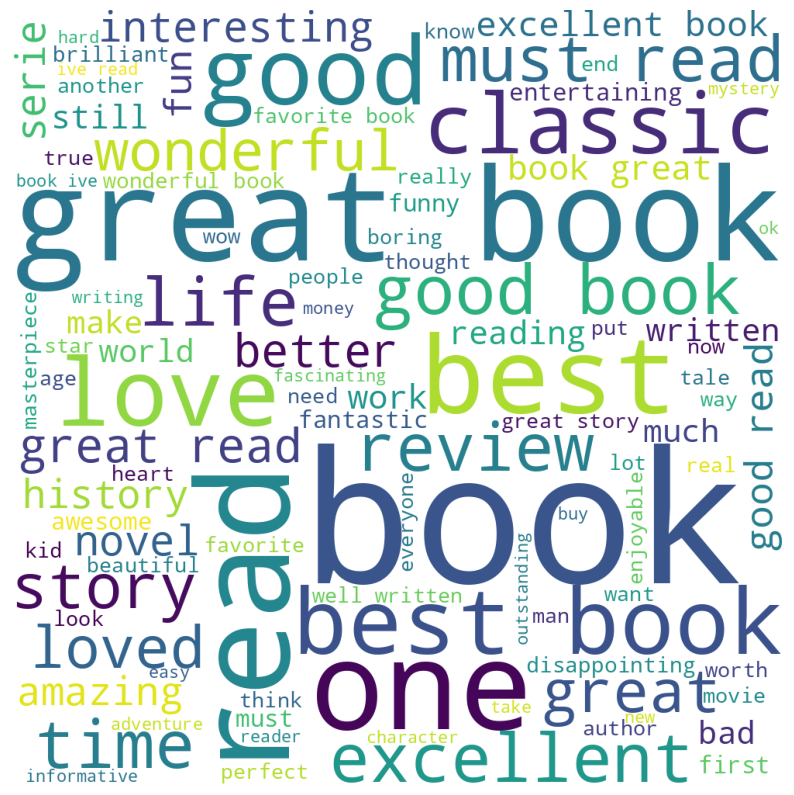

In [25]:
text= df['review/summary'].apply(lambda x: ''.join([char for char in x if char not in string.punctuation]).lower()).str.cat(sep=" ")
plt.rcParams['figure.figsize'] = (10, 15)
wordcloud = WordCloud(background_color = 'white', width = 1000,  height = 1000, max_words = 100).generate(text)
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

Then lets make it for every class to undersnad it more.

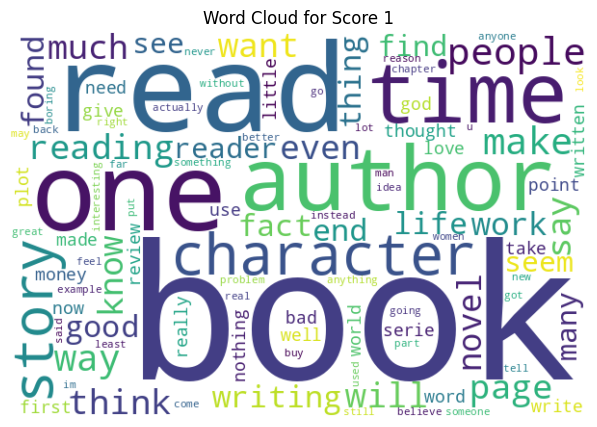

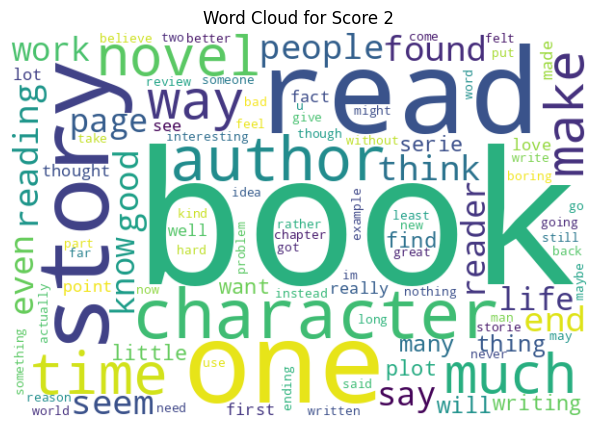

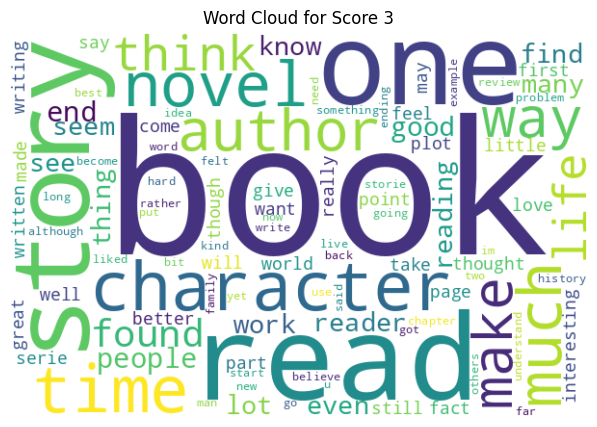

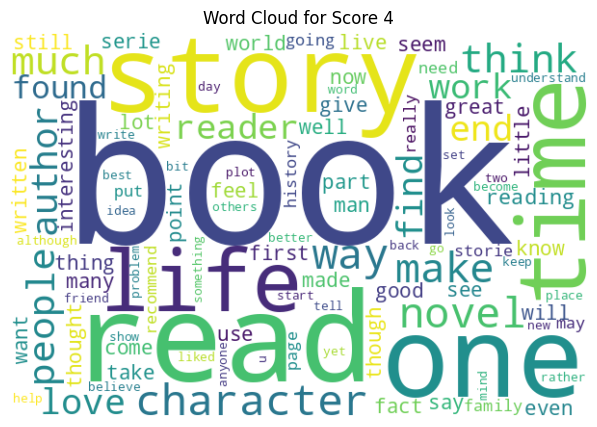

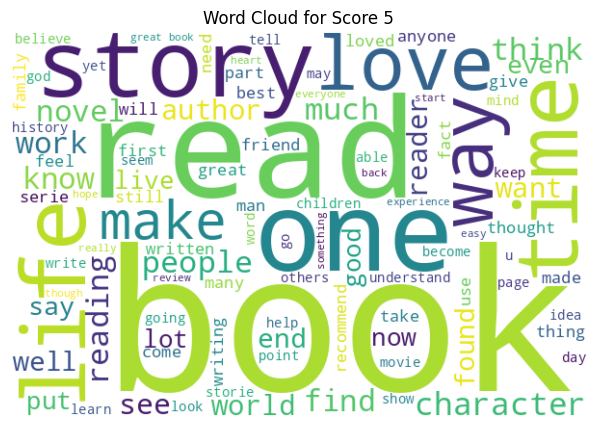

In [50]:
def generate_wordcloud_for_score(df, score):
    text = df[df['review/score'] == score]['review/text'].apply(lambda x: ''.join([char for char in x if char not in string.punctuation]).lower()).str.cat(sep=" ")
    wordcloud = WordCloud(width=600, height=400, background_color ='white', max_words = 100).generate(text)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for Score {score}')
    plt.show()

for score in range(1, 6):
    generate_wordcloud_for_score(data, score)

Actually there is no big differences between rating score and most used words, however we can see that in reviews with label 4 and 5 we have more positive adjectives like good, love, great.

In [31]:
df2 = df['categories'].value_counts().head(10).reset_index()
df2.columns = ['Genre', 'Count']

fig = px.pie(df2,
             values='Count',
             names='Genre',
             title='Distribution of Books Based on Genre',
             hole=.3)


fig.update_layout(
    title_font_size=20,
    legend_title='Genres',
    legend=dict(
        orientation="h",
        yanchor="top",
        y=0.5,
        xanchor="left",
        x=1.5
    ),

    autosize=False,
    width=800,
    height=800,
)

fig.update_traces(
    textinfo='percent+label',
    pull=[0.1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    marker=dict(line=dict(color='#000000', width=2))
)

fig.show()


Based on that we can see that Fiction is the most popular genere for making a review.

In [36]:
fig = px.scatter(data, x='word_count', y='review/score',
                 title='Review Length vs Score',
                 labels={'review_length': 'Review Length', 'score': 'Review Score'})

fig.update_layout(xaxis_title="Number of Words",
                  yaxis_title="Review Score",
                  coloraxis_colorbar=dict(title="Review Score"))

fig.show()

Based on that we can't observed any dependecy between score and text length.

In [47]:
corr_matrix = data.corr()

fig = px.imshow(corr_matrix,
                text_auto=True,
                aspect="auto",
                title="Correlation Analysis",
                labels=dict(x="Variable", y="Variable", color="Correlation"),
                x=data._get_numeric_data().columns.tolist(),
                y=data._get_numeric_data().columns.tolist(),
                color_continuous_scale='tealrose')
fig.update_coloraxes(colorscale="tealrose", cmin=-1, cmax=1)

fig.show()

<ipython-input-47-c9b0e5d9a3ba>:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



According to correlation analysis we can say that there is a moderate dependency between score and sentiment.

In [52]:

rating_counts = df[df['ratingsCount'] > 4000][['Title', 'ratingsCount']].drop_duplicates()

fig = px.bar(rating_counts, x='Title', y='ratingsCount',
             title='Highest Rated Books with Over 4000 Ratings Each',
             labels={'ratingsCount': 'Ratings Count', 'Title': 'Book Title'
                     })

fig.update_layout(
    xaxis_title="Book Title",
    yaxis_title="Ratings Count",
    title={
        'text': "Highest Rated Books with Over 4000 Ratings Each",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    font=dict(
        family="Arial, sans-serif",
        size=12,
    )
)

fig.show()


In [58]:

df['review/score'] = pd.to_numeric(df['review/score'], errors='coerce')
numeric_data = df.dropna(subset=['review/score'])

avg_cat_rating = numeric_data.groupby('categories')['review/score'].mean().sort_values(ascending=False).head(5)
avg_cat_rating_d = numeric_data.groupby('categories')['review/score'].mean().sort_values().head(5)

fig = go.Figure()

fig.add_trace(go.Bar(x=avg_cat_rating.index, y=avg_cat_rating, name='Top 5 genres', marker_color='blue'))
fig.add_trace(go.Bar(x=avg_cat_rating_d.index, y=avg_cat_rating_d, name='Bottom 5 genres', marker_color='red'))

fig.update_layout(
    title_text='Average Ratings by Book Genres',
    title_x=0.5,
    xaxis=dict(title='Categories'),
    yaxis=dict(title='Average Rating'),
    font=dict(family="Arial, sans-serif", size=12),
    legend=dict(y=1, x=1),
    barmode='group',
    xaxis_tickangle=-45
)

fig.update_layout(width=1000, height=700, autosize=False)
fig.show()


Some of the rating values can be assosiated with book category.

<ipython-input-46-9ff41fb93197>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x = df['review/score'],palette = 'pastel')


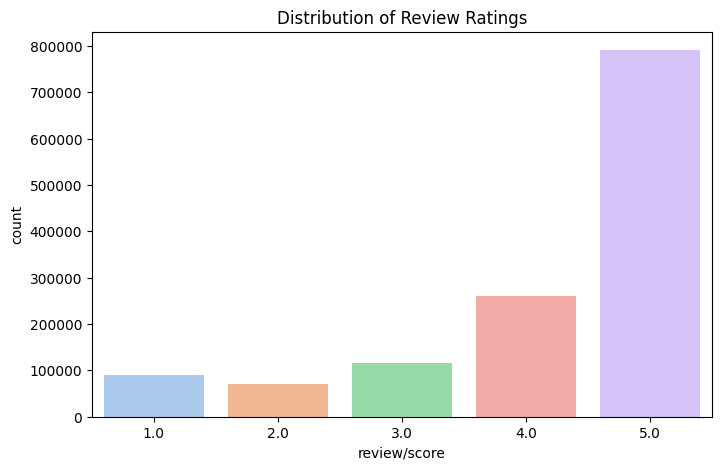

In [46]:
plt.figure(figsize = (8,5))
sns.countplot(x = df['review/score'],palette = 'pastel')
plt.title('Distribution of Review Ratings')
plt.show()

In [4]:
import plotly.express as px
import pandas as pd

data = {
    'sentiment': ['Positive', 'Neutral', 'Negative'],
    'count': [667037, 498661, 162077]
}
df = pd.DataFrame(data)

fig = px.pie(df, values='count', names='sentiment', title='Distribution of Tone')

fig.show()


According to Distribution of Tone and Distribution of Score we can observe an interesting point, that despite the fact that we have 70\% of 5 star reviews, the imbalance of tone occurs in smaller proportions. Only 52\% of the data have a positive tone. This may be due to the fact that sometimes a 5 rating is given despite a neutral review, because there is a ~38\% share of neutral reviews in Dataset.

### Models

Pre-trained model which is predict star rating based on the text. We need this modle as a baseline to make an comparison analysis of our models.

In [4]:
#df = pd.read_csv("/content/data_with_sentiment.csv")

In [27]:
#Baseline model
def baseline_prediction(review):
    tokenizer = AutoTokenizer.from_pretrained("nlptown/bert-base-multilingual-uncased-sentiment")
    model = AutoModelForSequenceClassification.from_pretrained("nlptown/bert-base-multilingual-uncased-sentiment")

    sentiment_model = pipeline('sentiment-analysis', model=model, tokenizer=tokenizer, max_length=512, truncation=True)

    res = sentiment_model(review)[0]["label"]
    result = re.findall(r'\d+',res)
    return result[0]

In [28]:
#make a small prediction just to test the accuracy
score_pred = data.iloc[:10000].clean_reviews.apply(baseline_prediction)

In [29]:
score_pred = score_pred.astype(int)

In [35]:
#calculating metrics
accuracy = accuracy_score(data["review/score"].values[:10000], score_pred.values)
print(f"Accuracy: {accuracy}")

f1 = f1_score(data["review/score"].values[:10000], score_pred.values, average='macro')
print(f"F1 Score: {f1}")

Accuracy: 0.48
F1 Score: 0.39600721064425415


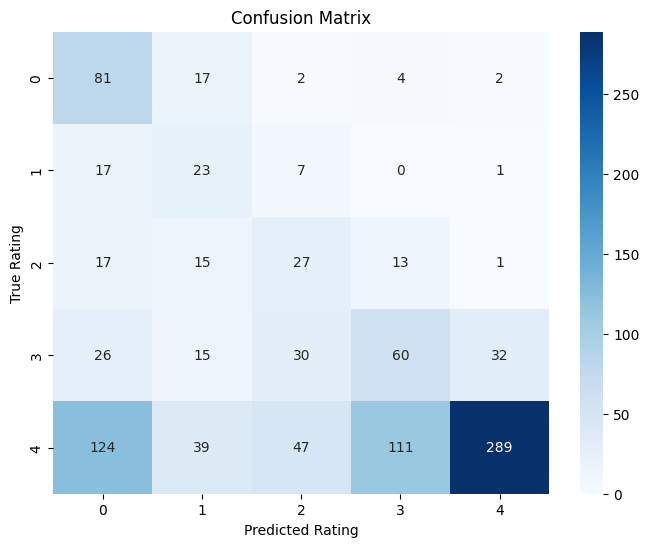

In [34]:
conf_matrix = confusion_matrix(data["review/score"].values[:10000], score_pred.values)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='g', cmap='Blues', xticklabels=True, yticklabels=True)
plt.xlabel('Predicted Rating')
plt.ylabel('True Rating')
plt.title('Confusion Matrix')
plt.show()


Well the accuracy of pre-trained specialized model is not good, lets try to improve the scores.

#### Model 1

Let's start with a simple ANN model which consist of few layers only. But to start we need to tokenize our data to make it sutable for tensorflow framework. Ans also we will devide our data to train and test samples.

In [22]:
data["clean_reviews"] = data["clean_reviews"].astype(str)

In [23]:
df = data.copy()
data = df.sample(n = 600000)

In [24]:
reviews =  data["clean_reviews"].values
ratings = data["review/score"].values

# Preprocessing: Tokenizing and Padding
tokenizer = Tokenizer(num_words=3000, oov_token="<OOV>")
tokenizer.fit_on_texts(reviews)
sequences = tokenizer.texts_to_sequences(reviews)
padded_sequences = pad_sequences(sequences, maxlen=500)

labels = tf.keras.utils.to_categorical(np.array(ratings) - 1, num_classes=5)

# Splitting dataset into training and testing
X_train, X_test, y_train, y_test = train_test_split(padded_sequences, labels, test_size=0.2, random_state=42)

In [25]:
# Model Creation
model = Sequential([
    Embedding(3000, 16, input_length=500),
    GlobalAveragePooling1D(),
    Dense(56, activation='relu'),
    Dense(5, activation='softmax')
])

model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 500, 16)           48000     
                                                                 
 global_average_pooling1d (  (None, 16)                0         
 GlobalAveragePooling1D)                                         
                                                                 
 dense (Dense)               (None, 56)                952       
                                                                 
 dense_1 (Dense)             (None, 5)                 285       
                                                                 
Total params: 49237 (192.33 KB)
Trainable params: 49237 (192.33 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


We used Embedding layer as a starting point because we are dealing with text data, GlobalAveragePooling1D layers helps to averages embedings data to reduce computation complexity. 2 Dense layer 1 helps model to find hidden patterns between data. Dense 2 is output layer with 5 classes.

In [26]:
#model fitting
model.fit(X_train, y_train, epochs=5, validation_split=0.2)
model.save_weights('model1.h5')

Epoch 1/5
12000/12000 [==============================] - 144s 12ms/step - loss: 0.9634 - accuracy: 0.6300 - val_loss: 0.8793 - val_accuracy: 0.6545
Epoch 2/5
12000/12000 [==============================] - 49s 4ms/step - loss: 0.8613 - accuracy: 0.6598 - val_loss: 0.8593 - val_accuracy: 0.6612
Epoch 3/5
12000/12000 [==============================] - 45s 4ms/step - loss: 0.8518 - accuracy: 0.6629 - val_loss: 0.8531 - val_accuracy: 0.6624
Epoch 4/5
12000/12000 [==============================] - 43s 4ms/step - loss: 0.8477 - accuracy: 0.6641 - val_loss: 0.8658 - val_accuracy: 0.6598
Epoch 5/5
12000/12000 [==============================] - 44s 4ms/step - loss: 0.8441 - accuracy: 0.6657 - val_loss: 0.8660 - val_accuracy: 0.6601


In [ ]:
# prediction on test data
predictions = np.argmax(model.predict(X_test), axis=1)
true_labels = np.argmax(y_test, axis=1)

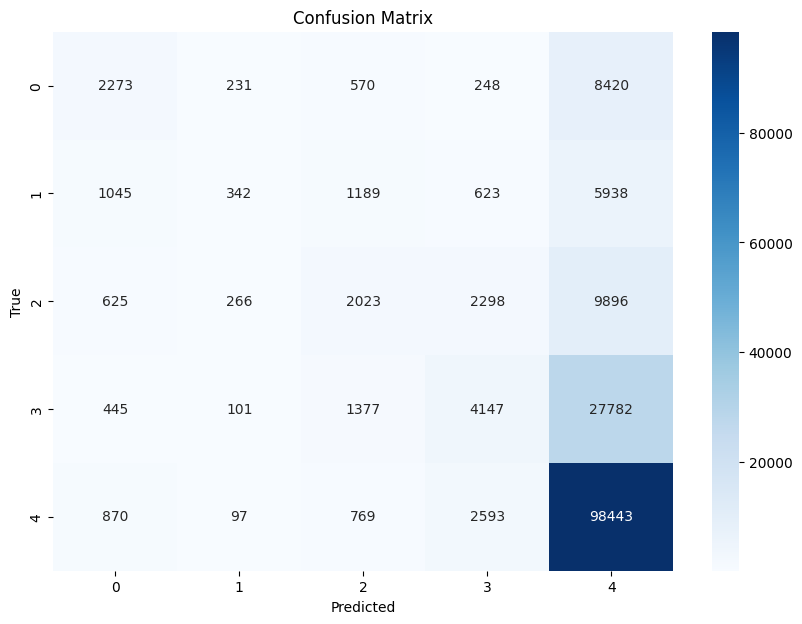

In [21]:
cm = confusion_matrix(true_labels, predictions)

plt.figure(figsize=(10,7))
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

In [22]:
report = classification_report(true_labels, predictions)
print("Classification Report:\n", report)

Classification Report:
               precision    recall  f1-score   support

           0       0.43      0.19      0.27     11742
           1       0.33      0.04      0.07      9137
           2       0.34      0.13      0.19     15108
           3       0.42      0.12      0.19     33852
           4       0.65      0.96      0.78    102772

    accuracy                           0.62    172611
   macro avg       0.44      0.29      0.30    172611
weighted avg       0.55      0.62      0.54    172611



Results is better than the baseline model but there can be some inprovements. Sinse we have imbalanced data we can see that our model only good at predicting score 5.

#### Model 2 Weights Updating

Now lets try to improve our data set and model by  weights update.

In [ ]:
#making weight adjestments
y_train_2 = np.argmax(y_train, axis=1)
class_weights = class_weight.compute_class_weight('balanced', classes=np.unique(y_train_2), y=y_train_2)
class_weights_dict = dict(enumerate(class_weights))

In [27]:
# Model
model = Sequential([
    Embedding(3000, 16, input_length=500),
    GlobalAveragePooling1D(),
    Dense(56, activation='relu'),
    Dense(5, activation='softmax')
])

model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

model.summary()



Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, 500, 16)           48000     
                                                                 
 global_average_pooling1d_1  (None, 16)                0         
  (GlobalAveragePooling1D)                                       
                                                                 
 dense_2 (Dense)             (None, 56)                952       
                                                                 
 dense_3 (Dense)             (None, 5)                 285       
                                                                 
Total params: 49237 (192.33 KB)
Trainable params: 49237 (192.33 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


So, the model construction is simmilar to the previuos one except new class_weights_dict which is tries to make data more balanced.

In [28]:
# Train the model with class weights
model.fit(X_train, y_train, epochs=5, validation_split=0.3, class_weight=class_weights_dict)

Epoch 1/5
15104/15104 [==============================] - 107s 7ms/step - loss: 1.4036 - accuracy: 0.4647 - val_loss: 1.2993 - val_accuracy: 0.4630
Epoch 2/5
15104/15104 [==============================] - 83s 5ms/step - loss: 1.3699 - accuracy: 0.4647 - val_loss: 1.2939 - val_accuracy: 0.4659
Epoch 3/5
15104/15104 [==============================] - 83s 6ms/step - loss: 1.3638 - accuracy: 0.4683 - val_loss: 1.4174 - val_accuracy: 0.4124
Epoch 4/5
15104/15104 [==============================] - 90s 6ms/step - loss: 1.3588 - accuracy: 0.4696 - val_loss: 1.3103 - val_accuracy: 0.4665
Epoch 5/5
15104/15104 [==============================] - 87s 6ms/step - loss: 1.3557 - accuracy: 0.4714 - val_loss: 1.2503 - val_accuracy: 0.4975


In [29]:
model.save_weights('model2.h5')

In [30]:
# Predictions for test
predictions = np.argmax(model.predict(X_test), axis=1)
true_labels = np.argmax(y_test, axis=1)
report = classification_report(true_labels, predictions)
print("Classification Report:\n", report)

5395/5395 [==============================] - 13s 2ms/step
Classification Report:
               precision    recall  f1-score   support

           0       0.26      0.45      0.33     11742
           1       0.17      0.36      0.23      9137
           2       0.22      0.33      0.26     15108
           3       0.32      0.32      0.32     33852
           4       0.80      0.60      0.69    102772

    accuracy                           0.50    172611
   macro avg       0.35      0.41      0.37    172611
weighted avg       0.59      0.50      0.53    172611



Results is a little bit controversial, since we inproved out presicion results, but recall results are drop down. However, we can see that prediction on classes (1,2,3,4) starts working better.  

#### Model 3 Undersampling

Now let's try to resample dataset to make it more balanced. The model construction will be the same we just change classes proportion.

In [34]:
from imblearn.under_sampling import RandomUnderSampler
# making data more balanced
rus = RandomUnderSampler(random_state=42)
X_train_rus, y_train_labels_rus = rus.fit_resample(X_train, y_train_2)

y_train_rus = tf.keras.utils.to_categorical(y_train_labels_rus, num_classes=5)

In [28]:
# Model
model = Sequential([
    Embedding(3000, 16, input_length=500),
    GlobalAveragePooling1D(),
    Dense(56, activation='relu'),
    Dense(5, activation='softmax')  # Output layer for 5 classes
])

model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

model.summary()


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_2 (Embedding)     (None, 500, 16)           48000     
                                                                 
 global_average_pooling1d_2  (None, 16)                0         
  (GlobalAveragePooling1D)                                       
                                                                 
 dense_4 (Dense)             (None, 56)                952       
                                                                 
 dense_5 (Dense)             (None, 5)                 285       
                                                                 
Total params: 49237 (192.33 KB)
Trainable params: 49237 (192.33 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [36]:
model.fit(X_train_rus, y_train_rus, epochs=5, validation_split=0.2)

4564/4564 [==============================] - 32s 7ms/step - loss: 1.3034 - accuracy: 0.3715 - val_loss: 10.5581 - val_accuracy: 0.0000e+00
Epoch 2/5
4564/4564 [==============================] - 24s 5ms/step - loss: 1.2199 - accuracy: 0.4347 - val_loss: 12.7129 - val_accuracy: 0.0000e+00
Epoch 3/5
4564/4564 [==============================] - 22s 5ms/step - loss: 1.2100 - accuracy: 0.4393 - val_loss: 14.3053 - val_accuracy: 0.0000e+00
Epoch 4/5
4564/4564 [==============================] - 25s 6ms/step - loss: 1.2065 - accuracy: 0.4420 - val_loss: 15.6606 - val_accuracy: 0.0000e+00
Epoch 5/5
4564/4564 [==============================] - 24s 5ms/step - loss: 1.2049 - accuracy: 0.4431 - val_loss: 17.0918 - val_accuracy: 0.0000e+00


In [ ]:
model.save_weights('model2.h5')

In [37]:
# Prediction
predictions = np.argmax(model.predict(X_test), axis=1)
true_labels = np.argmax(y_test, axis=1)
report = classification_report(true_labels, predictions)
print("Classification Report:\n", report)

5395/5395 [==============================] - 21s 4ms/step
Classification Report:
               precision    recall  f1-score   support

           0       0.15      0.60      0.24     11742
           1       0.15      0.36      0.22      9137
           2       0.19      0.34      0.24     15108
           3       0.21      0.48      0.29     33852
           4       0.00      0.00      0.00    102772

    accuracy                           0.18    172611
   macro avg       0.14      0.36      0.20    172611
weighted avg       0.08      0.18      0.11    172611



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


This approach are not working good on our data.

#### Model 4 More layers

Now let's try to add more different layers to test is it will improve our prediction or not. Our new model will be consist of Embedding layer as a starting point, next we will use Conv1D layer to detect some epatterns in our sequenses.  Pooling layer is going to reduce dimensions of our data. Also, we are going to use Dropout layer to prevent overfitting and then before output layer we are going to use Batch Normalisation layer which will help to normalise output and improve prediction accuracy.

In [29]:
#Model
model = Sequential([
    Embedding(3000, 16, input_length=500),
    Conv1D(32, 5, activation='relu'),
    GlobalAveragePooling1D(),
    Dense(128, activation='relu'),
    Dropout(0.2),
    Dense(64, activation='relu'),
    BatchNormalization(),
    Dense(5, activation='softmax')  # Output layer for 5 classes
])

model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_3 (Embedding)     (None, 500, 16)           48000     
                                                                 
 conv1d (Conv1D)             (None, 496, 32)           2592      
                                                                 
 global_average_pooling1d_3  (None, 32)                0         
  (GlobalAveragePooling1D)                                       
                                                                 
 dense_6 (Dense)             (None, 128)               4224      
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_7 (Dense)             (None, 64)                8256      
                                                      

In [45]:
#Model fit
model.fit(X_train, y_train, epochs=5, validation_split=0.2)
model.save_weights('model2.h5')

Epoch 1/5
17262/17262 [==============================] - 140s 8ms/step - loss: 1.0121 - accuracy: 0.6138 - val_loss: 0.9798 - val_accuracy: 0.6224
Epoch 2/5
17262/17262 [==============================] - 128s 7ms/step - loss: 0.9838 - accuracy: 0.6210 - val_loss: 0.9657 - val_accuracy: 0.6265
Epoch 3/5
17262/17262 [==============================] - 130s 8ms/step - loss: 0.9719 - accuracy: 0.6245 - val_loss: 0.9566 - val_accuracy: 0.6301
Epoch 4/5
17262/17262 [==============================] - 129s 7ms/step - loss: 0.9646 - accuracy: 0.6270 - val_loss: 0.9578 - val_accuracy: 0.6298
Epoch 5/5
17262/17262 [==============================] - 121s 7ms/step - loss: 0.9592 - accuracy: 0.6291 - val_loss: 0.9512 - val_accuracy: 0.6315


In [46]:
#Results
predictions = np.argmax(model.predict(X_test), axis=1)
true_labels = np.argmax(y_test, axis=1)
report = classification_report(true_labels, predictions)
print("Classification Report:\n", report)

5395/5395 [==============================] - 15s 3ms/step
Classification Report:
               precision    recall  f1-score   support

           0       0.38      0.39      0.39     11742
           1       0.32      0.05      0.09      9137
           2       0.37      0.18      0.24     15108
           3       0.44      0.11      0.17     33852
           4       0.68      0.95      0.79    102772

    accuracy                           0.63    172611
   macro avg       0.44      0.34      0.34    172611
weighted avg       0.57      0.63      0.56    172611



This model performs better than all previous model , it has quite goof metrics, however this model is really good only in dealing only with class 1 and class 5.

More Layers Improve the accuracy and class imbalance a little bit.

#### Model 5 LSTM 1

Now let's try to add LTSM layers to our model. We are going to take construction of model 1 and add Bidirectional(LSTM) layer. Bidirectiona layer will help to The model needs a wrapper for the LSTM layers to collect information from both past and future states. LSTM can permanently remember pieces of information from the past and also solves the vanishing gradient problem so it can improve the model's predictions. Pooling layer after lstm layer because this layers will help the model to focus on the most important features.

In [26]:
model = Sequential([
    Embedding(3000, 64, input_length= 500),
    Bidirectional(LSTM(64, return_sequences=True)),
    GlobalMaxPooling1D(),
    Dense(64, activation='relu'),
    Dropout(0.2),
    Dense(5, activation='softmax')
])

model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 500, 64)           192000    
                                                                 
 bidirectional (Bidirection  (None, 500, 128)          66048     
 al)                                                             
                                                                 
 global_max_pooling1d (Glob  (None, 128)               0         
 alMaxPooling1D)                                                 
                                                                 
 dense (Dense)               (None, 64)                8256      
                                                                 
 dropout (Dropout)           (None, 64)                0         
                                                                 
 dense_1 (Dense)             (None, 5)                 3

In [28]:
model.fit(X_train, y_train, epochs=5, validation_split=0.2, batch_size = 32)
model.save_weights('model4.h5')

Epoch 1/5
12000/12000 [==============================] - 516s 43ms/step - loss: 0.8767 - accuracy: 0.6570 - val_loss: 0.8132 - val_accuracy: 0.6810
Epoch 2/5
12000/12000 [==============================] - 444s 37ms/step - loss: 0.8035 - accuracy: 0.6827 - val_loss: 0.7868 - val_accuracy: 0.6858
Epoch 3/5
12000/12000 [==============================] - 442s 37ms/step - loss: 0.7731 - accuracy: 0.6938 - val_loss: 0.7815 - val_accuracy: 0.6918
Epoch 4/5
12000/12000 [==============================] - 441s 37ms/step - loss: 0.7479 - accuracy: 0.7015 - val_loss: 0.7782 - val_accuracy: 0.6908
Epoch 5/5
12000/12000 [==============================] - 441s 37ms/step - loss: 0.7236 - accuracy: 0.7103 - val_loss: 0.7752 - val_accuracy: 0.6944


3750/3750 [==============================] - 52s 14ms/step
Accuracy: 0.693025
F1 Score: 0.9679630155768028


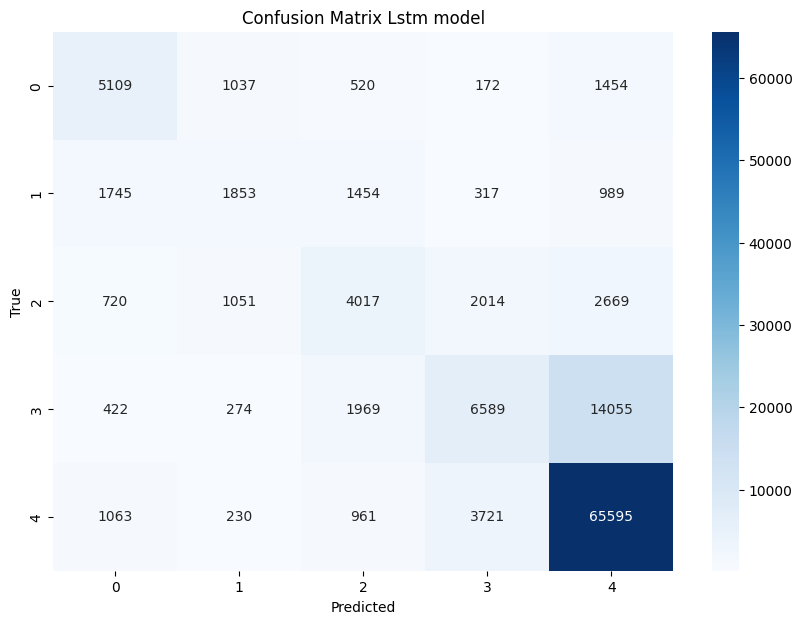

In [39]:
# Results
predictions = np.argmax(model.predict(X_test), axis=1)
true_labels = np.argmax(y_test, axis=1)
accuracy_metric = Accuracy()
accuracy_metric.update_state(true_labels, predictions)

precision_metric = Precision()
precision_metric.update_state(true_labels, predictions)
recall_metric = Recall()
recall_metric.update_state(true_labels, predictions)
f1_score = 2 * (precision_metric.result().numpy() * recall_metric.result().numpy()) / (precision_metric.result().numpy() + recall_metric.result().numpy())

# Confusion Matrix
cm = confusion_matrix(true_labels, predictions)

print('Accuracy:', accuracy_metric.result().numpy())
print('F1 Score:', f1_score)
plt.figure(figsize=(10,7))
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix Lstm model')
plt.show()

In [40]:
report = classification_report(true_labels, predictions)
print("Classification Report:\n", report)

Classification Report:
               precision    recall  f1-score   support

           0       0.56      0.62      0.59      8292
           1       0.42      0.29      0.34      6358
           2       0.45      0.38      0.41     10471
           3       0.51      0.28      0.36     23309
           4       0.77      0.92      0.84     71570

    accuracy                           0.69    120000
   macro avg       0.54      0.50      0.51    120000
weighted avg       0.66      0.69      0.67    120000



Resulst are really goof, among all calsses, we have good accuracy and f1 scores.

#### Model 6 LSTM 2

THis model different from the previous one by adding Conv1D and pooling layers after lstm layer because this layerss will help the model to caputure and focus on the most important features.

In [40]:
#Model
model = Sequential([
    Embedding(3000, 64, input_length= 500),
    Bidirectional(LSTM(64, return_sequences=True)),
    Conv1D(128, 5, activation='relu'),
    GlobalMaxPooling1D(),
    Dense(64, activation='relu'),
    BatchNormalization(),
    Dropout(0.2),
    Dense(5, activation='softmax')
])

model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

model.summary()


Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_5 (Embedding)     (None, 500, 64)           192000    
                                                                 
 bidirectional_1 (Bidirecti  (None, 500, 128)          66048     
 onal)                                                           
                                                                 
 conv1d_1 (Conv1D)           (None, 496, 128)          82048     
                                                                 
 global_max_pooling1d_1 (Gl  (None, 128)               0         
 obalMaxPooling1D)                                               
                                                                 
 dense_13 (Dense)            (None, 64)                8256      
                                                                 
 batch_normalization_1 (Bat  (None, 64)               

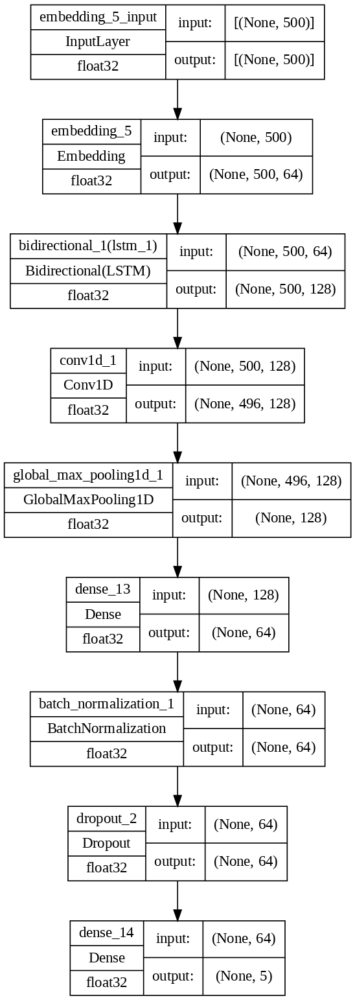

In [41]:
#Visualisation of Model
tf.keras.utils.plot_model(model, to_file='lstm_model.png', show_shapes=True, show_layer_names=True,show_dtype=True,dpi=120)

In [38]:
model.fit(X_train, y_train, epochs=7, validation_split=0.2, batch_size = 32)
model.save_weights('model5.h5')

Epoch 1/7
12000/12000 [==============================] - 517s 43ms/step - loss: 0.8758 - accuracy: 0.6574 - val_loss: 0.8225 - val_accuracy: 0.6764
Epoch 2/7
12000/12000 [==============================] - 449s 37ms/step - loss: 0.8080 - accuracy: 0.6822 - val_loss: 0.7806 - val_accuracy: 0.6915
Epoch 3/7
12000/12000 [==============================] - 450s 37ms/step - loss: 0.7755 - accuracy: 0.6936 - val_loss: 0.7732 - val_accuracy: 0.6950
Epoch 4/7
12000/12000 [==============================] - 451s 38ms/step - loss: 0.7482 - accuracy: 0.7044 - val_loss: 0.7750 - val_accuracy: 0.6960
Epoch 5/7
12000/12000 [==============================] - 452s 38ms/step - loss: 0.7232 - accuracy: 0.7150 - val_loss: 0.7697 - val_accuracy: 0.6972
Epoch 6/7
12000/12000 [==============================] - 458s 38ms/step - loss: 0.6955 - accuracy: 0.7260 - val_loss: 0.7814 - val_accuracy: 0.6964
Epoch 7/7
12000/12000 [==============================] - 458s 38ms/step - loss: 0.6684 - accuracy: 0.7371 - val_

In [31]:
report = classification_report(true_labels, predictions)
print("Classification Report:\n", report)

Classification Report:
               precision    recall  f1-score   support

           0       0.62      0.57      0.59      8292
           1       0.41      0.25      0.32      6358
           2       0.43      0.40      0.41     10471
           3       0.50      0.29      0.37     23309
           4       0.77      0.92      0.84     71570

    accuracy                           0.69    120000
   macro avg       0.54      0.49      0.50    120000
weighted avg       0.66      0.69      0.67    120000



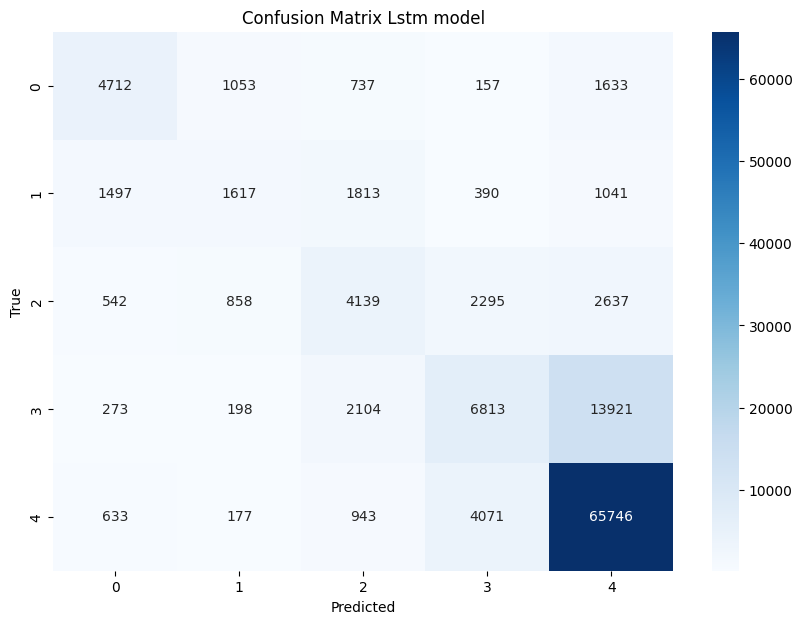

In [30]:
cm = confusion_matrix(true_labels, predictions)
plt.figure(figsize=(10,7))
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix Lstm')
plt.show()

The results for LSTM 1 are simmilar with LSTM 2 just we have slight lover recall score there but main metricl like accuracy and F1 score are the same.

#### Model 7 LSTM 3

Architectural improvements to the model LSTM 1 can lead to improved performance through improved feature extraction, improved model regularization, and training stability. The basic idea is to try to improve the model's ability to capture a wider range of patterns in the data.

In [47]:
from keras.models import Sequential
from keras.layers import Embedding, Bidirectional, LSTM, Conv1D, GlobalMaxPooling1D, Dense, BatchNormalization, Dropout, LayerNormalization
from keras.regularizers import l2

model = Sequential([
    Embedding(3000, 128, input_length=500),
    Bidirectional(LSTM(64, return_sequences=True)),
    Conv1D(128, 5, activation='relu', kernel_regularizer=l2(0.01)),
    Conv1D(64, 3, activation='relu', kernel_regularizer=l2(0.01)),
    GlobalMaxPooling1D(),
    Dense(64, activation='relu'),
    LayerNormalization(),
    Dropout(0.5),
    Dense(32, activation='relu'),
    BatchNormalization(),
    Dropout(0.5),
    Dense(5, activation='softmax')
])

model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

model.summary()


Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_8 (Embedding)     (None, 500, 128)          384000    
                                                                 
 bidirectional_9 (Bidirecti  (None, 500, 128)          98816     
 onal)                                                           
                                                                 
 conv1d_9 (Conv1D)           (None, 496, 128)          82048     
                                                                 
 conv1d_10 (Conv1D)          (None, 494, 64)           24640     
                                                                 
 global_max_pooling1d_7 (Gl  (None, 64)                0         
 obalMaxPooling1D)                                               
                                                                 
 dense_16 (Dense)            (None, 128)              

In [48]:
# adding earlystoping for model training
checkpoint_cb = ModelCheckpoint('model5.h5', save_best_only=True)
early_stopping_cb =EarlyStopping(patience=5, restore_best_weights=True)
model.fit(X_train, y_train, epochs=7, validation_split=0.2, batch_size = 32,callbacks=[checkpoint_cb, early_stopping_cb])
#model.save_weights('model5.h5')

Epoch 1/7
12000/12000 [==============================] - 518s 43ms/step - loss: 0.9983 - accuracy: 0.6220 - val_loss: 0.8528 - val_accuracy: 0.6621
Epoch 2/7
    3/12000 [..............................] - ETA: 6:31 - loss: 0.9070 - accuracy: 0.6562

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


12000/12000 [==============================] - 465s 39ms/step - loss: 0.8531 - accuracy: 0.6681 - val_loss: 0.8278 - val_accuracy: 0.6742
Epoch 3/7
12000/12000 [==============================] - 465s 39ms/step - loss: 0.8193 - accuracy: 0.6808 - val_loss: 0.8151 - val_accuracy: 0.6804
Epoch 4/7
12000/12000 [==============================] - 466s 39ms/step - loss: 0.7958 - accuracy: 0.6895 - val_loss: 0.8086 - val_accuracy: 0.6814
Epoch 5/7
12000/12000 [==============================] - 467s 39ms/step - loss: 0.7737 - accuracy: 0.6985 - val_loss: 0.8134 - val_accuracy: 0.6777
Epoch 6/7
12000/12000 [==============================] - 462s 39ms/step - loss: 0.7537 - accuracy: 0.7070 - val_loss: 0.8126 - val_accuracy: 0.6853
Epoch 7/7
12000/12000 [==============================] - 462s 38ms/step - loss: 0.7319 - accuracy: 0.7155 - val_loss: 0.8124 - val_accuracy: 0.6886


3750/3750 [==============================] - 56s 14ms/step
Accuracy: 0.6864667
F1 Score: 0.9674188328071472


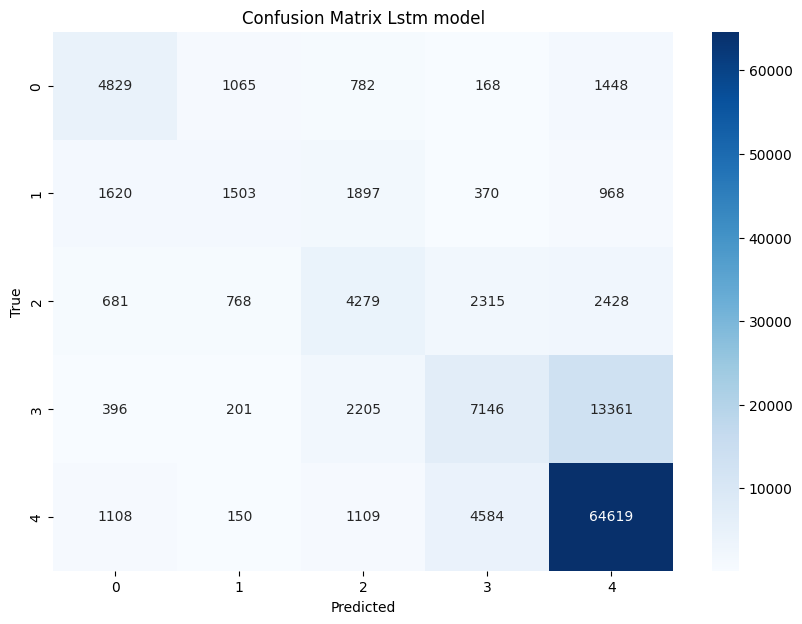

In [49]:
predictions = np.argmax(model.predict(X_test), axis=1)
true_labels = np.argmax(y_test, axis=1)
accuracy_metric = Accuracy()
accuracy_metric.update_state(true_labels, predictions)

precision_metric = Precision()
precision_metric.update_state(true_labels, predictions)
recall_metric = Recall()
recall_metric.update_state(true_labels, predictions)
f1_score = 2 * (precision_metric.result().numpy() * recall_metric.result().numpy()) / (precision_metric.result().numpy() + recall_metric.result().numpy())

# Confusion Matrix
cm = confusion_matrix(true_labels, predictions)

print('Accuracy:', accuracy_metric.result().numpy())
print('F1 Score:', f1_score)
plt.figure(figsize=(10,7))
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix Lstm model')
plt.show()

In [50]:
report = classification_report(true_labels, predictions)
print("Classification Report:\n", report)

Classification Report:
               precision    recall  f1-score   support

           0       0.56      0.58      0.57      8292
           1       0.41      0.24      0.30      6358
           2       0.42      0.41      0.41     10471
           3       0.49      0.31      0.38     23309
           4       0.78      0.90      0.84     71570

    accuracy                           0.69    120000
   macro avg       0.53      0.49      0.50    120000
weighted avg       0.66      0.69      0.66    120000



Unfortunately, the additional layers did not greatly affect the quality of the model’s prediction; our indicators do not differ significantly from the performance of model LSTM 2.

However, it is worth noting that all variations of LSTM models have the best results among all models in terms of all metrics. These models can clearly be used to predict review ratings based on text.

#### Model 8 LSTM with Setiment


In [30]:
#Encode Setiment
sentiment_mapping = {
    'positive': 1,
    'neutral': 0,
    'negative': -1
}

data['Sentiment_num'] = data['Sentiment'].replace(sentiment_mapping)

In [31]:
# we need to split data with sentiment data too
X_train, X_test, y_train, y_test, sentiment_train, sentiment_test = train_test_split(
    data['clean_reviews'].values,
    labels,
    data['Sentiment_num'].values,
    test_size=0.2,
    random_state=42
)

In [32]:
# Tokenizing and padding
tokenizer = Tokenizer(num_words=3000, oov_token="<OOV>")
tokenizer.fit_on_texts(X_train)
X_vec = tokenizer.texts_to_sequences(X_train)
X_emb = pad_sequences(X_vec , maxlen=500)

vec_test = tokenizer.texts_to_sequences(X_test)
X_emb_test = pad_sequences(vec_test, maxlen=500)


In [35]:

custom_learning_rate = 1e-4
regularizer = l2(0.01)

# Input
text_input = Input(shape=(500,), dtype='int32', name='text_input')
x = Embedding(3000, 256, input_length=500)(text_input)
x = Bidirectional(LSTM(64, return_sequences=True))(x)
x = GlobalMaxPooling1D()(x)
x = Dense(64, activation='relu', kernel_regularizer=regularizer)(x)
x = Dropout(0.3)(x)
text_output = Dense(5, activation='softmax')(x)

# Sentiment
sentiment_input = Input(shape=(1,), name='sentiment_input')
sentiment_dense = Dense(16, activation='relu', kernel_regularizer=regularizer)(sentiment_input)

# Join
concatenated = concatenate([text_output, sentiment_dense], axis=-1)
final_output = Dense(5, activation='softmax', kernel_regularizer=regularizer)(concatenated)

# Model
model = Model(inputs=[text_input, sentiment_input], outputs=final_output)

# Compile
optimizer = Adam(learning_rate=custom_learning_rate)
model.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])


In [38]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 text_input (InputLayer)     [(None, 500)]                0         []                            
                                                                                                  
 embedding_4 (Embedding)     (None, 500, 256)             768000    ['text_input[0][0]']          
                                                                                                  
 bidirectional (Bidirection  (None, 500, 128)             164352    ['embedding_4[0][0]']         
 al)                                                                                              
                                                                                                  
 global_max_pooling1d (Glob  (None, 128)                  0         ['bidirectional[0][0]']   

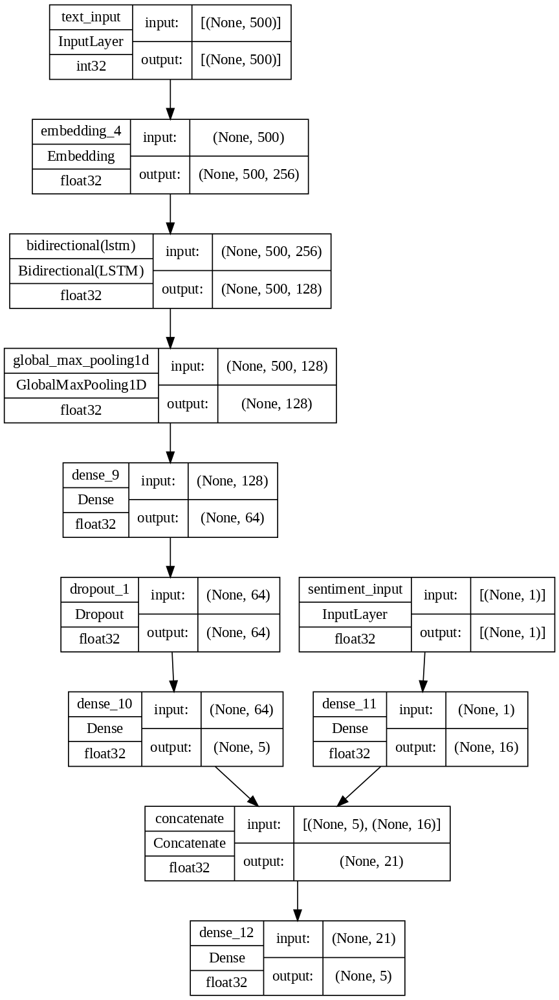

In [36]:
tf.keras.utils.plot_model(model, to_file='more_layers_model.png', show_shapes=True, show_layer_names=True,show_dtype=True,dpi=120)

In [37]:
#Adding early stopping
checkpoint_cb = ModelCheckpoint('model6.h5', save_best_only=True)
early_stopping_cb =EarlyStopping(patience=5, restore_best_weights=True)
model.fit([X_emb, sentiment_train], y_train, validation_data=([X_emb_test, sentiment_test], y_test), epochs=10, batch_size=32,callbacks=[checkpoint_cb, early_stopping_cb] )

Epoch 1/10
15000/15000 [==============================] - 575s 38ms/step - loss: 1.2117 - accuracy: 0.5835 - val_loss: 1.0631 - val_accuracy: 0.5968
Epoch 2/10
    3/15000 [..............................] - ETA: 7:23 - loss: 1.0268 - accuracy: 0.6250

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


15000/15000 [==============================] - 507s 34ms/step - loss: 1.0450 - accuracy: 0.6102 - val_loss: 1.0254 - val_accuracy: 0.6175
Epoch 3/10
15000/15000 [==============================] - 504s 34ms/step - loss: 1.0208 - accuracy: 0.6223 - val_loss: 1.0183 - val_accuracy: 0.6250
Epoch 4/10
15000/15000 [==============================] - 505s 34ms/step - loss: 1.0091 - accuracy: 0.6292 - val_loss: 1.0064 - val_accuracy: 0.6277
Epoch 5/10
15000/15000 [==============================] - 501s 33ms/step - loss: 1.0015 - accuracy: 0.6320 - val_loss: 1.0022 - val_accuracy: 0.6302
Epoch 6/10
15000/15000 [==============================] - 498s 33ms/step - loss: 0.9945 - accuracy: 0.6334 - val_loss: 1.0010 - val_accuracy: 0.6287
Epoch 7/10
15000/15000 [==============================] - 497s 33ms/step - loss: 0.9897 - accuracy: 0.6344 - val_loss: 0.9989 - val_accuracy: 0.6294
Epoch 8/10
15000/15000 [==============================] - 497s 33ms/step - loss: 0.9847 - accuracy: 0.6349 - val_loss

3750/3750 [==============================] - 46s 12ms/step


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.40      0.36      0.38      8403
           1       0.00      0.00      0.00      6307
           2       0.00      0.00      0.00     10521
           3       0.22      0.19      0.20     23321
           4       0.73      0.95      0.83     71448

    accuracy                           0.63    120000
   macro avg       0.27      0.30      0.28    120000
weighted avg       0.51      0.63      0.56    120000



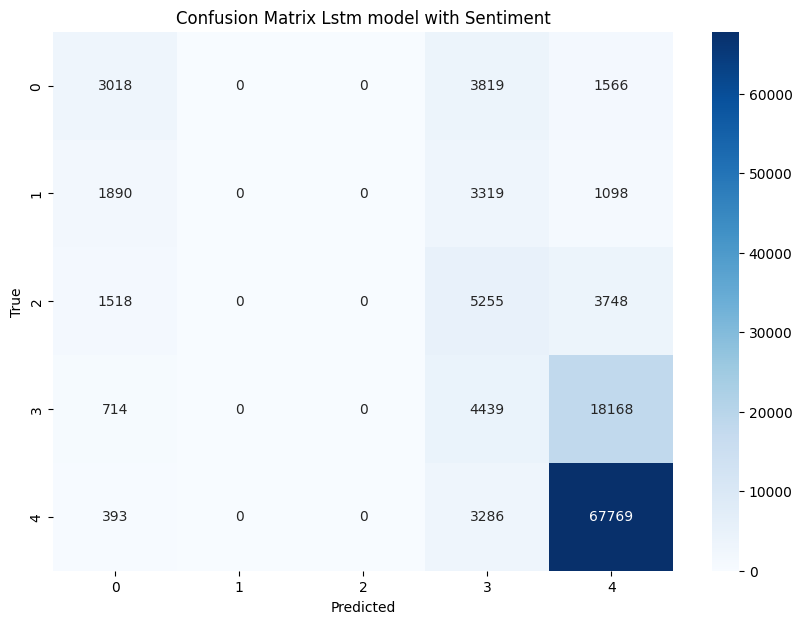

In [39]:
predictions_prob = model.predict([X_emb_test, sentiment_test])
predictions = np.argmax(predictions_prob, axis=1)
true_labels = np.argmax(y_test, axis=1)

# Print classification report
print(classification_report(true_labels, predictions))

# Vizualizations
cm =  confusion_matrix(true_labels, predictions)
plt.figure(figsize=(10,7))
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix Lstm model with Sentiment')
plt.show()

The results are good but ltsm without sentiment performs better in terms of preduction 2 and 3 classes.

### Futher reseraches

So, futher area of investigation how we can predict review score basing on text is it extract emotions of review from text which can improve prediction. Because there is a possibility of high correlation between emotions and score review. For example - text with possitive emotions like joy or happines will be related to 4 or 5 rating. Whereas negative emotions like sadness or anger illustrates low scores like 1 and 2.

In [ ]:
# example how we can extract emotions :
def emotion_detection(review):
    tokenizer = AutoTokenizer.from_pretrained("bhadresh-savani/distilbert-base-uncased-emotion")
    model = AutoModelForSequenceClassification.from_pretrained("bhadresh-savani/distilbert-base-uncased-emotion")
    emotion_pipeline = pipeline('text-classification', model=model, tokenizer=tokenizer)
    return emotion_pipeline(review)[0]["label"]

### Conclusion

* The 9 models were trained. It is possible to predict review rating  based on text with a good level of accuracy

* There is a correlation between Tonality and Rating Score

* LSTM models have the highest perfomance among all tested models

* Sentiment dosen't improve models quality

### Refferences


1. https://github.com/yaxenia/Earnings-calls-and-stock-prices/blob/main/Summarisation_Sentiment_Modeling.ipynb ( pre-proccesing functions)

2. https://www.kaggle.com/datasets/mohamedbakhet/amazon-books-reviews

3. https://www.kaggle.com/code/tanavbajaj/eda-using-llms-on-trip-advisor-reviews

4. https://www.kaggle.com/code/jiyasin07/trip-advisor-hotel-reviews-keras-roberta

5. https://www.kaggle.com/code/redpen12/transformer-based-sentiment-analysis

6. https://www.kaggle.com/code/shubham2703/amazon-books-review-eda-sentiment-analysis